In [2]:
from keras.models import load_model
import numpy as np
import argparse
import imutils
import cv2

from vis.utils import utils
from keras import activations

In [17]:
model = load_model('../male_female_cnn/santa_not_santa.model')
layer_idx = utils.find_layer_idx(model, 'preds') # layer name

model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

In [18]:
from vis.visualization import visualize_activation

from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (18, 6)


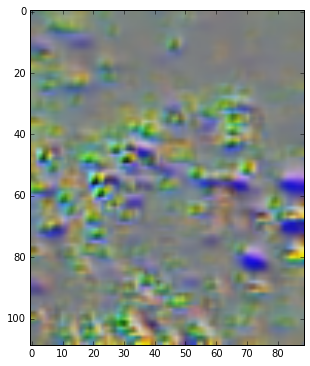

In [19]:
# 20 is the imagenet category for 'ouzel'
img = visualize_activation(model, layer_idx, filter_indices=0)
plt.imshow(img)
# the hell is this

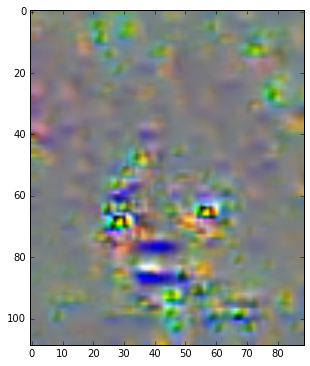

In [20]:
img = visualize_activation(model, layer_idx, filter_indices=1)
plt.imshow(img)

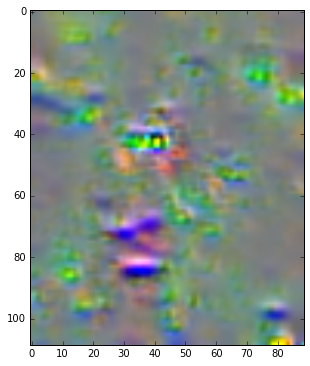

In [27]:
# img = visualize_activation(model, layer_idx, filter_indices=1, max_iter=500, verbose=True)
img = visualize_activation(model, layer_idx, filter_indices=1, max_iter=500, verbose=False)
plt.imshow(img)

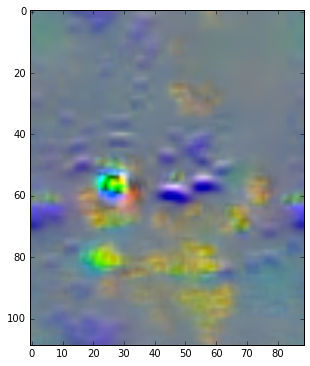

In [30]:
from vis.input_modifiers import Jitter

# 20 is the imagenet category for 'ouzel'
# Jitter 16 pixels along all dimensions to during the optimization process.
img = visualize_activation(model, layer_idx, filter_indices=1, max_iter=500, input_modifiers=[Jitter(16)])
plt.imshow(img)

In [35]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 109, 89, 30)       2280      
_________________________________________________________________
activation_1 (Activation)    (None, 109, 89, 30)       0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 54, 44, 30)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 54, 44, 40)        19240     
_________________________________________________________________
activation_2 (Activation)    (None, 54, 44, 40)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 27, 22, 40)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 27, 22, 60)        14460     
__________

/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using f

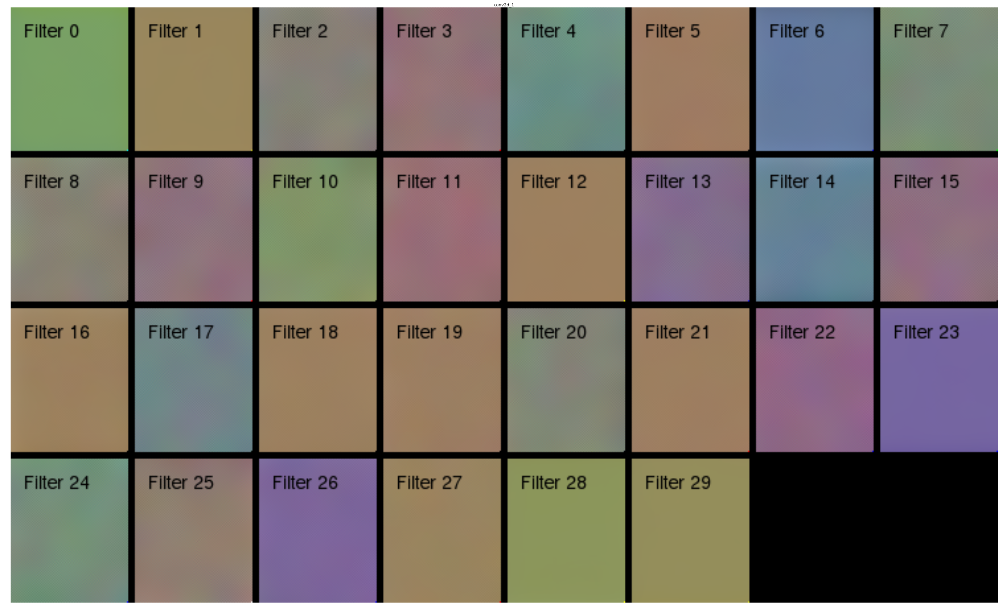

In [36]:
from vis.visualization import get_num_filters

# The name of the layer we want to visualize
# You can see this in the model definition.
layer_name = 'conv2d_1'
layer_idx = utils.find_layer_idx(model, layer_name)

# Visualize all filters in this layer.
filters = np.arange(get_num_filters(model.layers[layer_idx]))

# Generate input image for each filter.
vis_images = []
for idx in filters:
    img = visualize_activation(model, layer_idx, filter_indices=idx)
    
    # Utility to overlay text on image.
    img = utils.draw_text(img, 'Filter {}'.format(idx))    
    vis_images.append(img)

# Generate stitched image palette with 8 cols.
stitched = utils.stitch_images(vis_images, cols=8)    
plt.axis('off')
plt.imshow(stitched)
plt.title(layer_name)
plt.show()

/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using f

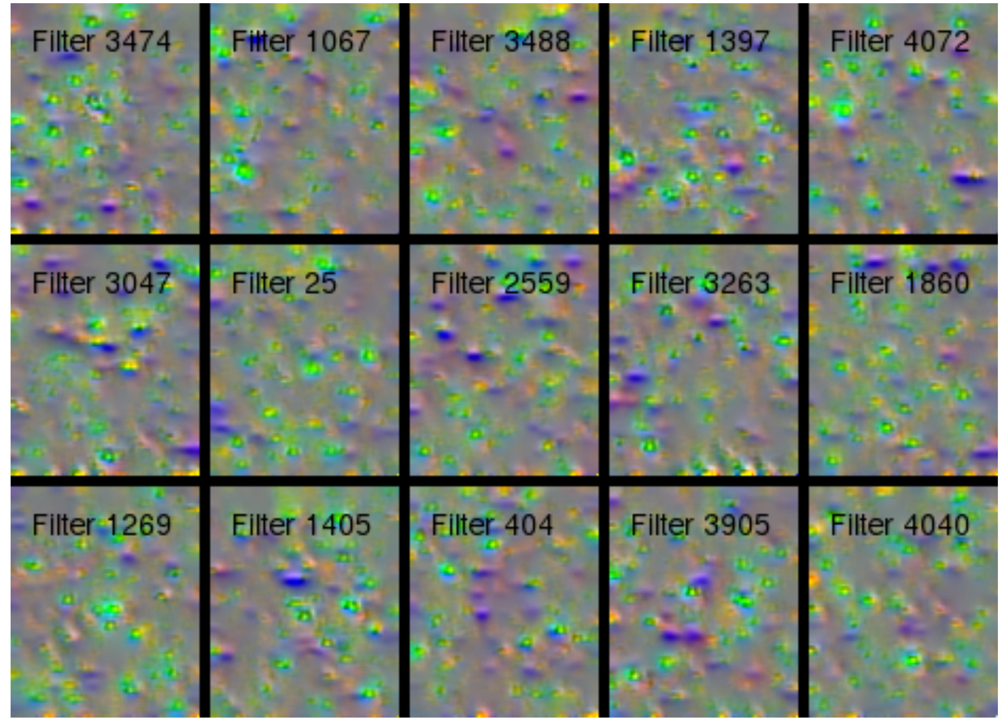

/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/choppy/miniconda3/envs/choppy/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


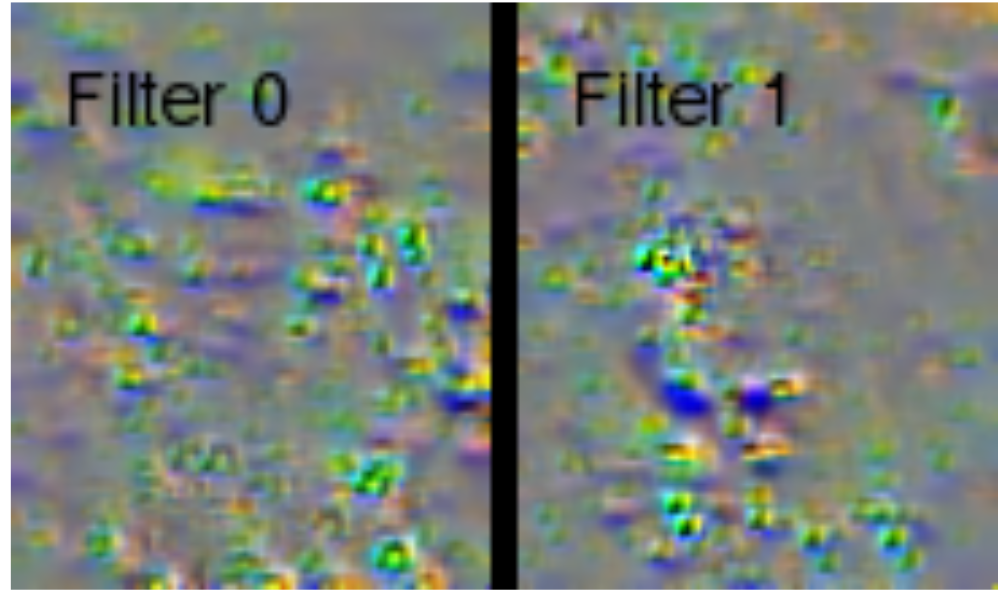

In [39]:
selected_indices = []
# for layer_name in ['conv2d_1', 'conv2d_2', 'conv2d_3']:
for layer_name in ['dense_1', 'preds']:
    layer_idx = utils.find_layer_idx(model, layer_name)

    # Visualize all filters in this layer.
    filters = np.random.permutation(get_num_filters(model.layers[layer_idx]))[:15]
    selected_indices.append(filters)

    # Generate input image for each filter.
    vis_images = []
    for idx in filters:
        img = visualize_activation(model, layer_idx, filter_indices=idx)

        # Utility to overlay text on image.
        img = utils.draw_text(img, 'Filter {}'.format(idx))    
        vis_images.append(img)

    # Generate stitched image palette with 5 cols so we get 2 rows.
    stitched = utils.stitch_images(vis_images, cols=5)    
    plt.figure()
    plt.axis('off')
    plt.imshow(stitched)
    plt.show()